In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import fastai
print(fastai.__version__)
from fastai.vision import *
from fastai.vision.gan import *
from fastai.vision.data import *
from tqdm.notebook import tqdm
import torch
import torchvision.transforms as T
from PIL import Image

import numpy as np
from sklearn.neighbors import NearestNeighbors
import pytorch_fid_wrapper as pfw

1.0.61


In [3]:
torch.cuda.is_available()

True

In [4]:
path = untar_data(URLs.LSUN_BEDROOMS)

In [5]:
def get_data(bs, size):
    return (GANItemList.from_folder(path, noise_sz=100)
               .split_by_rand_pct(valid_pct=0.2, seed=123)
               .label_from_func(noop)
               .transform(tfms=[[crop_pad(size=size, row_pct=(0,1), col_pct=(0,1))], []], size=size, tfm_y=True)
               .databunch(bs=bs)
               .normalize(stats = [torch.tensor([0.5,0.5,0.5]), torch.tensor([0.5,0.5,0.5])], do_x=False, do_y=True))
               

In [6]:
data = get_data(128, 64)

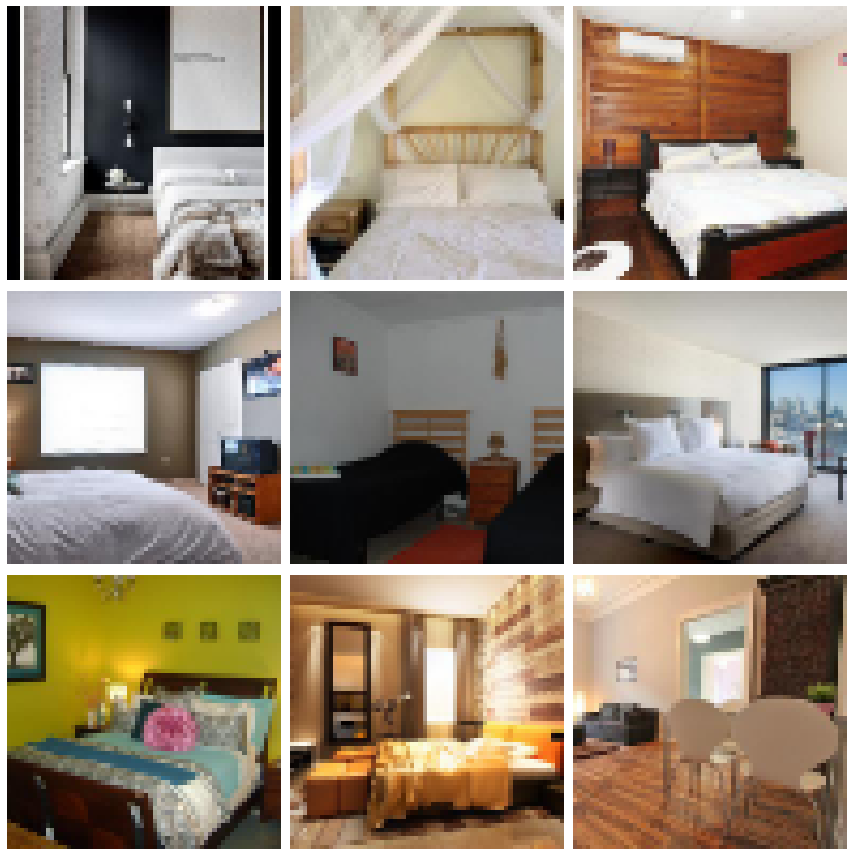

In [8]:
data.show_batch(rows=3)

## WGAN

In [9]:
orig = []
for i in range(len(data.valid_ds.y)):
    o = data.valid_ds.y[i].resize(size=(3,64,64)).data
    orig.append(o)
orig = torch.stack(orig).type(torch.FloatTensor)

In [10]:
real_m, real_s = pfw.get_stats(orig)

  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

epoch,train_loss,valid_loss,gen_loss,disc_loss,time
0,-0.050870,-0.050549,0.014531,-0.083991,05:16
1,-0.060037,0.063541,-0.049354,-0.070035,05:14
2,-0.011115,-0.025963,0.073111,-0.021727,04:56
3,-0.018396,-0.103908,-0.038089,-0.011842,04:49
4,-0.014398,-0.009721,0.009677,-0.015039,04:48
5,0.000714,-0.006096,0.128998,-0.036887,04:49
6,-0.009824,-0.045608,0.010355,-0.010620,04:49
7,-0.007878,-0.003965,0.014361,-0.014997,04:49
8,-0.008312,-0.012505,-0.009568,-0.007026,04:49
9,-0.010428,-0.031933,-0.009887,-0.008059,04:49


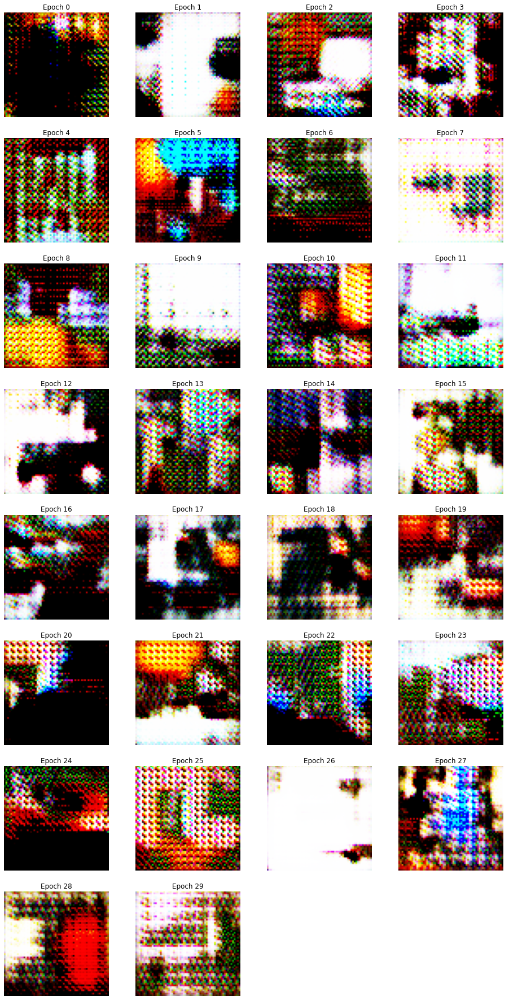

epoch,train_loss,valid_loss,gen_loss,disc_loss,time
0,-0.092282,0.740344,0.027407,-0.097340,04:48
1,-0.084401,-0.203995,-0.028895,-0.089656,04:49
2,-0.086057,-0.075067,0.001729,-0.092499,04:49
3,-0.063724,-0.833699,0.046736,-0.080454,04:49
4,-0.053631,-0.021706,0.010250,-0.026440,04:51
5,-0.088605,-0.013346,0.078292,-0.099649,05:01
6,-0.001869,-0.032213,0.143724,-0.046307,05:15
7,-0.015414,-0.025181,0.001664,-0.012180,05:16
8,-0.002427,0.000986,-0.003003,-0.003319,05:16
9,0.002077,0.007096,0.013341,-0.008333,04:50


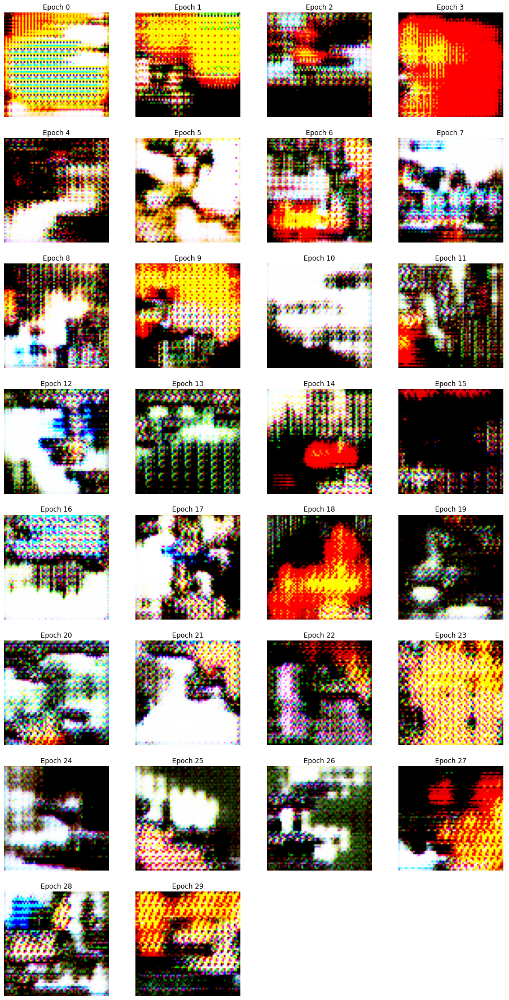

  0%|          | 0/2 [00:00<?, ?it/s]

epoch,train_loss,valid_loss,gen_loss,disc_loss,time
0,-0.859444,-0.713614,0.674053,-1.139662,04:56
1,-0.825552,-0.550203,0.644355,-1.120346,05:17
2,-0.758124,-0.317469,0.535610,-1.039065,05:15
3,-0.869366,-0.421001,0.564239,-1.134171,05:13
4,-0.641353,-0.220510,0.514798,-0.883535,04:50
5,-0.626419,-0.458421,0.457497,-0.856558,04:50
6,-0.593946,-0.266520,0.461097,-0.800235,04:50
7,-0.582561,-0.439891,0.428226,-0.787035,04:50
8,-0.585388,-0.231870,0.445041,-0.808921,04:50
9,-0.558166,-0.339795,0.417214,-0.744212,04:50


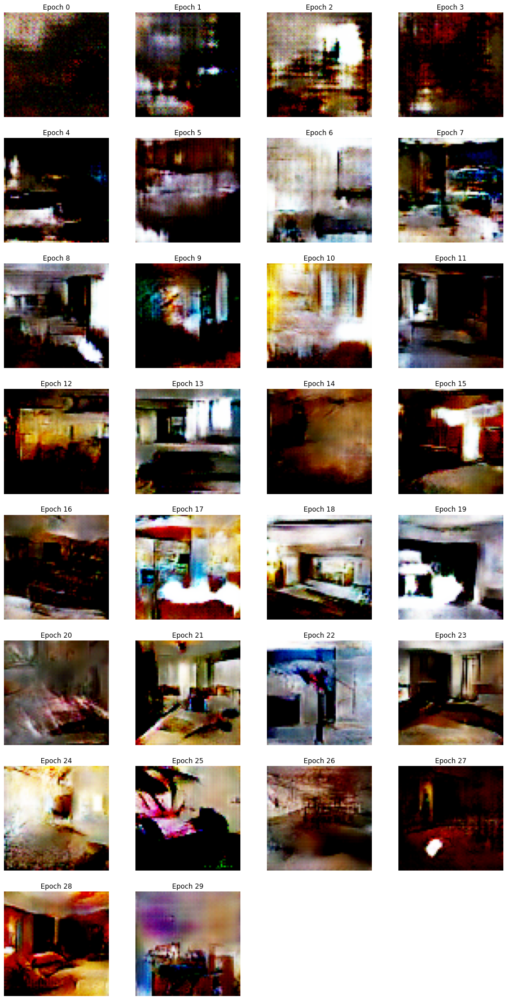

epoch,train_loss,valid_loss,gen_loss,disc_loss,time
0,-0.790466,-0.699375,0.602010,-1.051845,04:49
1,-0.786503,-0.355596,0.615608,-1.075234,04:50
2,-0.866633,-0.374642,0.572856,-1.168153,04:50
3,-0.661014,-0.331853,0.507204,-0.894569,04:51
4,-0.615117,-0.442255,0.456077,-0.837204,04:50
5,-0.577670,-0.218411,0.422443,-0.790481,04:50
6,-0.554609,-0.431331,0.418495,-0.737939,04:50
7,-0.942287,-0.255461,0.458091,-1.218294,04:50
8,-0.536340,-0.267280,0.438226,-0.727493,04:50
9,-0.687492,-0.168282,0.515332,-0.980300,04:50


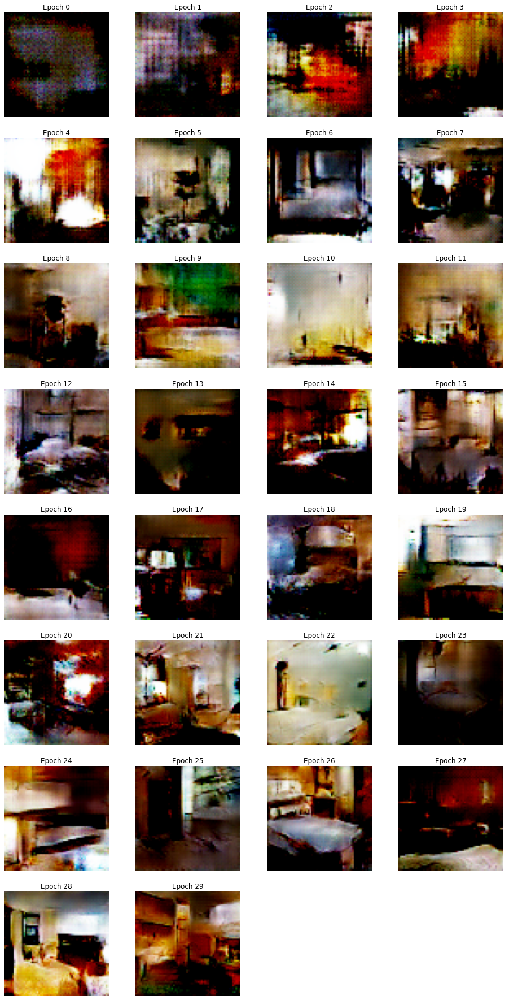

  0%|          | 0/2 [00:00<?, ?it/s]

epoch,train_loss,valid_loss,gen_loss,disc_loss,time
0,-1.198747,-0.330702,0.788372,-1.582842,04:49
1,-1.193963,-0.287080,0.800484,-1.597479,04:51
2,-1.177708,-0.274951,0.799795,-1.597798,04:50
3,-1.214222,-0.294825,0.801428,-1.602698,04:50
4,-1.199908,-0.379796,0.801444,-1.604773,04:51
5,-1.183402,-0.394689,0.801135,-1.604911,04:51
6,-1.210651,-0.339846,0.796363,-1.597210,04:51
7,-1.180065,-0.314334,0.777838,-1.575783,04:50
8,-1.153579,-0.348172,0.762982,-1.560546,04:51
9,-1.177595,-0.355063,0.750309,-1.548799,04:56


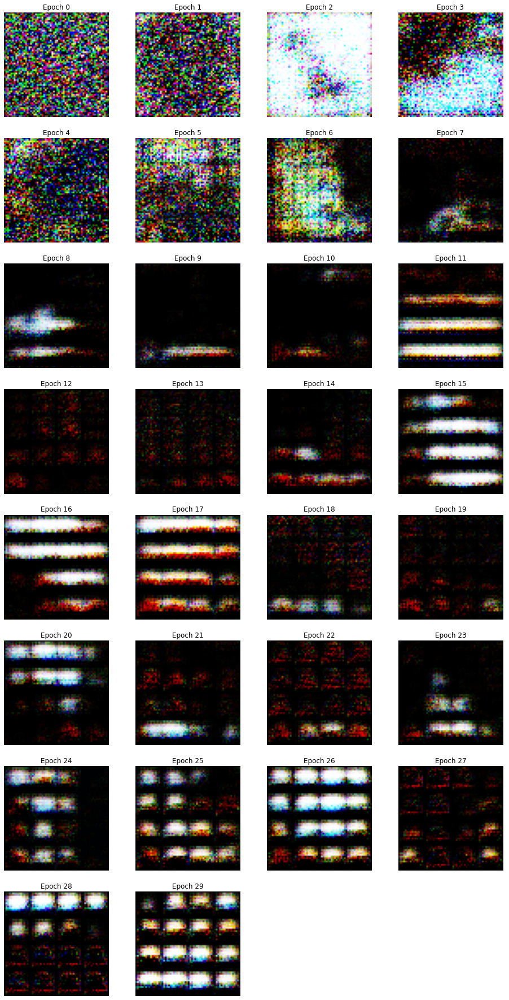

epoch,train_loss,valid_loss,gen_loss,disc_loss,time
0,-1.201501,-0.244031,0.793693,-1.586741,04:49
1,-1.191501,-0.368450,0.799874,-1.594280,04:50
2,-1.179590,-0.337541,0.800781,-1.600201,04:50
3,-1.214218,-0.366781,0.800386,-1.602497,04:50
4,-1.198725,-0.389932,0.800016,-1.603068,04:50
5,-1.178956,-0.360053,0.796622,-1.598447,04:50
6,-1.197144,-0.364797,0.780451,-1.577864,04:50
7,-1.168636,-0.367084,0.760702,-1.558644,04:50
8,-1.146998,-0.357364,0.751698,-1.550248,04:50
9,-1.173517,-0.354839,0.744195,-1.543007,04:51


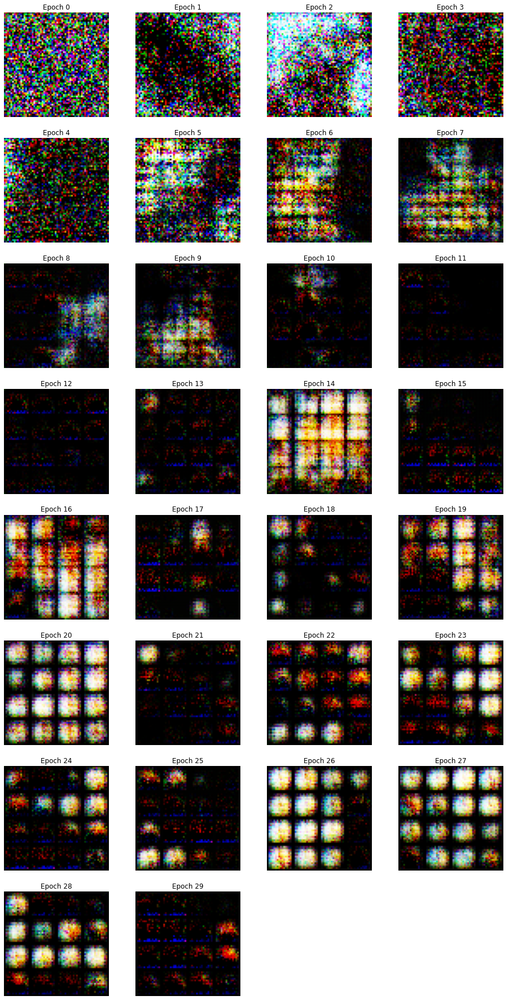

In [10]:
lrs = [2e-3, 2e-4, 2e-5]
opts = [partial(optim.Adam, betas = (0.,0.99)), partial(optim.RMSprop)]
n_epochs = 30
predictions = []
fids = []
neighbours = []
for lr in tqdm(lrs):
    lr_preds = []
    lr_fids = []
    lr_nn = []
    for opt in tqdm(opts):
        generator = basic_generator(in_size=64, n_channels=3, n_extra_layers=1)
        critic    = basic_critic(in_size=64, n_channels=3, n_extra_layers=1)
        learner = GANLearner.wgan(data, generator, critic, switch_eval=False,
                        opt_func = opt, wd=0.)
        learner.fit(n_epochs, lr)        
        preds = []
        for i in range(len(data.valid_ds)):
            p = learner.predict(data.valid_ds.x[i])
            preds.append(p[1])
        preds = torch.stack(preds).type(torch.FloatTensor)
        lr_preds.append(preds)
        val_fid = pfw.fid(preds, real_m=real_m, real_s=real_s)
        lr_fids.append(val_fid)
        knn_distance_based = (
            NearestNeighbors(n_neighbors=5, metric="precomputed")
                .fit(torch.cdist(orig[None].flatten(2), preds[None].flatten(2))[0])
        )
        nn = knn_distance_based.kneighbors(return_distance=False)
        lr_nn.append(nn)
    predictions.append(lr_preds)
    fids.append(lr_fids)
    neighbours.append(lr_nn)

In [11]:
# save fid
fid_df = pd.DataFrame(fids)
fid_df.columns = ['Adam', 'RMSProp']
fid_df.index = ['2e-3', '2e-4', '2e-5']
fid_df.to_csv('wgan_fid_scores.csv')


In [12]:
# save knn
for i, nn in enumerate(neighbours):
    for j, nnn in enumerate(nn):
        knn_df = pd.DataFrame(nnn)

        knn_df.columns = ['n1', 'n2', 'n3', 'n4', 'n5']

        knn_df.to_csv(f'wgan_neighbours_orig_{i}_{j}.csv', index=False)


In [13]:
# save preds
for i, pred in enumerate(predictions):
    for j, p in enumerate(pred):
        torch.save(p, f'wgan_predictions_{i}_{j}.pt')

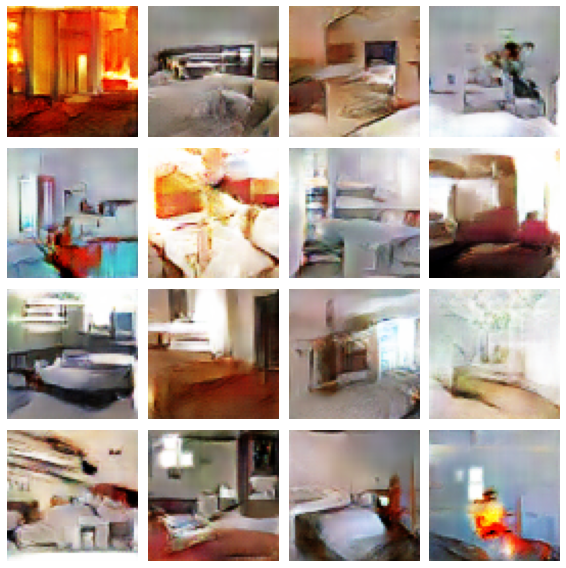

In [21]:
learner.gan_trainer.switch(gen_mode=True)
learner.show_results(ds_type=DatasetType.Valid, rows=4, figsize=(8,8))

epoch,train_loss,valid_loss,gen_loss,disc_loss,time
0,-1.163422,-0.237666,0.756457,-1.528302,05:17
1,-0.892482,-0.506805,0.625652,-1.194830,05:11
2,-0.725260,-0.379364,0.519811,-0.992232,05:10
3,-0.746881,-0.418049,0.525937,-0.978007,05:11
4,-0.642783,-0.297904,0.517320,-0.885898,05:09
5,-0.785547,-0.343555,0.494888,-1.036570,05:13
6,-1.079050,-0.202005,0.540087,-1.386235,05:10
7,-0.531916,-0.250275,0.472359,-0.737610,05:12
8,-0.390032,-0.353667,0.453922,-0.574363,05:14
9,-0.755844,-0.051753,0.487948,-1.029168,05:21


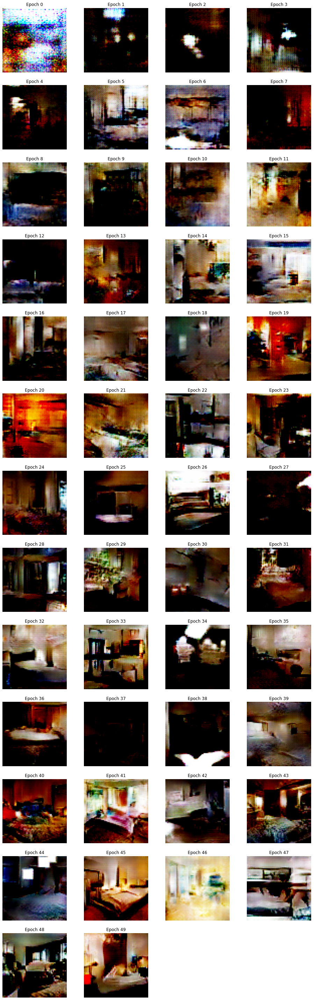

In [11]:
lr = 2e-4
opt = partial(optim.Adam, betas = (0.,0.99))
n_epochs = 50
generator = basic_generator(in_size=64, n_channels=3, n_extra_layers=1)
critic    = basic_critic(in_size=64, n_channels=3, n_extra_layers=1)
learner = GANLearner.wgan(data, generator, critic, switch_eval=False,
                opt_func = opt, wd=0.)
learner.fit(n_epochs, lr)        
preds = []
for i in range(len(data.valid_ds)):
    p = learner.predict(data.valid_ds.x[i])
    preds.append(p[1])
preds = torch.stack(preds).type(torch.FloatTensor)
val_fid = pfw.fid(preds, real_m=real_m, real_s=real_s)
knn_distance_based = (
    NearestNeighbors(n_neighbors=5, metric="precomputed")
        .fit(torch.cdist(orig[None].flatten(2), preds[None].flatten(2))[0])
)
nn = knn_distance_based.kneighbors(return_distance=False)

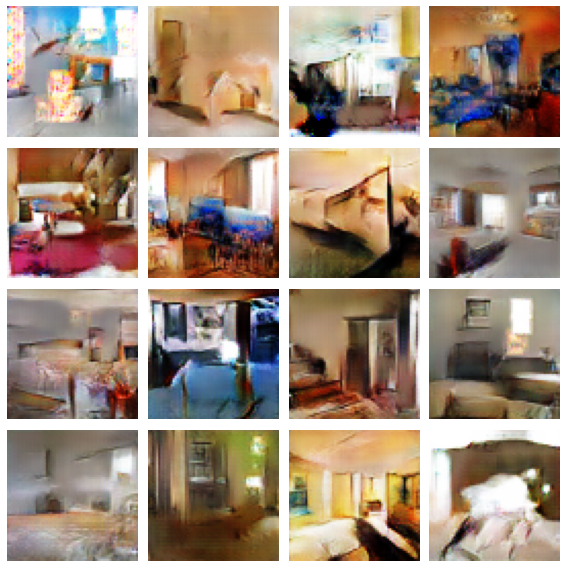

In [12]:
learner.gan_trainer.switch(gen_mode=True)
learner.show_results(ds_type=DatasetType.Valid, rows=4, figsize=(8,8))

In [13]:
val_fid

90.5205492838844

In [14]:
knn_df = pd.DataFrame(nn)
knn_df.columns = ['n1', 'n2', 'n3', 'n4', 'n5']
knn_df.to_csv(f'./../results/knn/wgan_neighbours_orig_best.csv', index=False)

In [15]:
torch.save(p, f'./../results/pred/wgan_predictions_best.pt')